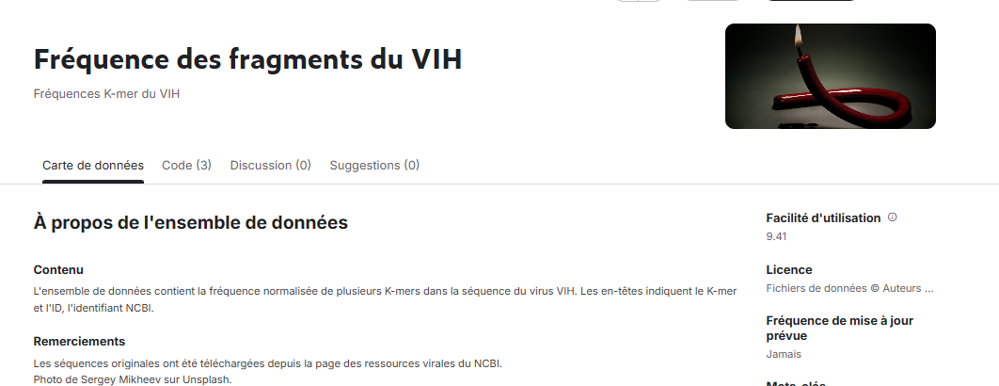

In [44]:
from IPython.display import Image, display

display(Image(filename="Images/lx.png", width=800))

#  Importation des bibliothèques


In [1]:
# ==============================
#  Importation des bibliothèques
# ==============================
# pandas (pd) --> pour charger, manipuler et nettoyer les données tabulaires (CSV, Excel, SQL…).
import pandas as pd
# numpy (np) -->  pour les opérations mathématiques et vectorielles rapides (utile pour les matrices, les statistiques, etc.).
import numpy as np
# ====Visualisation des données======
# matplotlib.pyplot (plt) --> bibliothèque de base pour tracer des graphiques statiques (histogrammes, courbes, etc.).
import matplotlib.pyplot as plt
# seaborn (sns) --> outil de visualisation statistique basé sur matplotlib, pour des graphiques plus esthétiques et automatiques (corrélations, distributions…).
import seaborn as sns
# •	plotly.express (px) et plotly.graph_objects (go) --> pour créer des graphiques interactifs en 2D et 3D, parfaits pour explorer les données de manière dynamique.
import plotly.express as px
import plotly.graph_objects as go
# ====Bibliothèques de calcul scientifique avancé======
#jax, jax.numpy, flax.linen, optax --> ensemble d’outils de Deep Learning et optimisation.
import jax
import jax.numpy as jnp
from jax import random, jit, value_and_grad
import flax.linen as nn
import optax
# ============Bibliothèques de Machine Learning (Scikit-learn et XGBoost)=================
# 	train_test_split, cross_val_score --> pour diviser le dataset en données d’entraînement et de test, et valider les modèles.
from sklearn.model_selection import train_test_split, cross_val_score
# StandardScaler, MinMaxScaler --> pour normaliser ou standardiser les variables, afin que toutes les features aient la même échelle.
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# LogisticRegression, RandomForestClassifier, XGBClassifier --> différents modèles de classification utilisés pour comparer les performances sur le dataset (ex : prédiction du statut VIH).
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
# metrics --> ensemble complet de fonctions pour évaluer la performance des modèles (accuracy, F1, AUC, etc.).
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, classification_report, confusion_matrix, roc_curve, auc
# ======== Réduction de dimension et visualisation avancée===========
# PCA (Principal Component Analysis) --> pour réduire la dimension du dataset et visualiser les patterns principaux.
from sklearn.decomposition import PCA
# TSNE (t-Distributed Stochastic Neighbor Embedding) --> pour visualiser les clusters cachés en 2D ou 3D.
from sklearn.manifold import TSNE
# ============= Analyse mathématique et statistique=============
# ledoit_wolf --> calcule une estimation robuste de la covariance, utile pour des données bruitées
from sklearn.covariance import ledoit_wolf
 # cdist et linalg → pour mesurer les distances entre points et manipuler les matrices (inversions, décompositions…).
from scipy.spatial.distance import cdist
from scipy import linalg
# ============
#KMeans est un algorithme de clustering non supervisé.
from sklearn.cluster import KMeans
# f_oneway sert à réaliser un ANOVA à un facteur (One-Way ANOVA).
from scipy.stats import f_oneway

# ===Style général====
# sns.set(style="whitegrid")-->applique un thème visuel clair et professionnel à tous les graphiques Seaborn/Matplotlib.

sns.set(style="whitegrid")


#  Chargement et exploration des données

In [3]:
# ==============================
#  Chargement et exploration des données
# ==============================
 # Lecture du fichier CSV contenant les fréquences de k-mers
df = pd.read_csv("KmerData/KmerData.csv") 
# On utilise la colonne 'id' (nom de la séquence ou échantillon) comme index
df.set_index('id', inplace=True)           

print("Aperçu des données :")
# Affiche les 10 premières lignes pour un aperçu rapide
display(df.head(10))                        



Aperçu des données :


,A,C,T,G,AA,AC,AT,AG,CA,CC,...,GGCT,GGCG,GGTA,GGTC,GGTT,GGTG,GGGA,GGGC,GGGT,GGGG
id,,,,,,,,,,,,,,,,,,,,,
NC_001802,0.356388,0.178848,0.222416,0.242348,0.118422,0.057087,0.075172,0.105785,0.082144,0.041181,...,0.002615,0.001199,0.002833,0.001526,0.002288,0.002506,0.007628,0.003378,0.002833,0.005775
MZ159978,0.365376,0.173008,0.223142,0.238474,0.123013,0.056861,0.081039,0.104544,0.083837,0.038169,...,0.003695,0.000784,0.002575,0.001232,0.002575,0.002463,0.007837,0.004030,0.002351,0.006605
MZ159979,0.364876,0.173707,0.225527,0.235891,0.125634,0.057352,0.079662,0.102085,0.082479,0.038310,...,0.003043,0.000676,0.003381,0.001465,0.002254,0.001691,0.007889,0.003719,0.002367,0.006424
MZ076687,0.367500,0.173182,0.223750,0.235568,0.125597,0.060923,0.077631,0.103433,0.085360,0.037850,...,0.002842,0.000568,0.003070,0.001023,0.002615,0.002046,0.007276,0.003297,0.002842,0.006367
MZ076688,0.365433,0.173972,0.224052,0.236543,0.125738,0.058723,0.078146,0.102908,0.083939,0.039073,...,0.003067,0.000682,0.003408,0.001363,0.002613,0.001931,0.007726,0.003408,0.002499,0.006135
MZ076689,0.368290,0.171348,0.225255,0.235108,0.127435,0.059357,0.079520,0.102062,0.084391,0.037947,...,0.002833,0.000567,0.002833,0.001700,0.002493,0.002606,0.007478,0.003399,0.003059,0.006911
MW693026,0.374722,0.172688,0.219338,0.233251,0.130043,0.060695,0.080225,0.103848,0.083850,0.037306,...,0.002690,0.000702,0.002573,0.001170,0.001872,0.002339,0.008188,0.002924,0.002222,0.005732
MW693027,0.363888,0.179783,0.217690,0.238085,0.123836,0.059424,0.076497,0.103769,0.083925,0.041242,...,0.002218,0.001109,0.002772,0.001552,0.002218,0.002550,0.008428,0.003216,0.003327,0.006321
OM025084,0.364638,0.171470,0.224769,0.239123,0.124096,0.056650,0.078464,0.105509,0.081803,0.037284,...,0.003228,0.000891,0.003562,0.001781,0.002004,0.002226,0.008238,0.003006,0.002115,0.005566


In [4]:
print("\nInformations :")
# Type des colonnes, taille du dataset, nombre de valeurs non-nulles
print(df.info())                        




Informations :
<class 'pandas.core.frame.DataFrame'>
Index: 21696 entries, NC_001802 to X01762
Columns: 340 entries, A to GGGG
dtypes: float64(340)
memory usage: 56.4+ MB
None


In [6]:
print("\nValeurs manquantes par colonne :")
# Vérifie s’il y a des données manquantes à traiter
print(df.isnull().sum())                 





Valeurs manquantes par colonne :
A       0
C       0
T       0
G       0
AA      0
       ..
GGTG    0
GGGA    0
GGGC    0
GGGT    0
GGGG    0
Length: 340, dtype: int64


In [7]:
print("\nStatistiques descriptives :")
 # Moyenne, écart-type, min, max, etc. pour chaque variable (utile pour la normalisation)
display(df.describe().T)                  



Statistiques descriptives :


,count,mean,std,min,25%,50%,75%,max
A,21696.0,0.365430,0.014816,0.204943,0.360636,0.363213,0.366828,0.487775
C,21696.0,0.175584,0.012422,0.000000,0.174511,0.176290,0.177832,0.250796
T,21696.0,0.222945,0.018838,0.207655,0.220088,0.221433,0.222646,0.607275
G,21696.0,0.235736,0.011828,0.115268,0.236586,0.239123,0.241193,0.256181
AA,21696.0,0.124648,0.010133,0.045863,0.121045,0.123021,0.125806,0.282768
...,...,...,...,...,...,...,...,...
GGTG,21696.0,0.002255,0.000456,0.000225,0.002025,0.002317,0.002551,0.006647
GGGA,21696.0,0.007219,0.001936,0.000111,0.007346,0.007757,0.008144,0.010041
GGGC,21696.0,0.003109,0.000703,0.000000,0.003003,0.003240,0.003483,0.005152
GGGT,21696.0,0.002583,0.000798,0.000000,0.002526,0.002781,0.002979,0.007726


In [8]:
# Création de la variable cible si inexistante
if 'statut_VIH' not in df.columns:
    df['statut_VIH'] = np.random.choice([0,1], size=len(df))

print("\nRépartition des classes :")
# Vérifie l’équilibre des classes (0 = négatif, 1 = positif)
print(df['statut_VIH'].value_counts())     


Répartition des classes :
statut_VIH
1    10867
0    10829
Name: count, dtype: int64


#  Préparation des données

In [9]:
# ==============================
# Préparation des données
# ==============================

# Séparation des variables explicatives (X) et de la cible (y)
X = df.drop(columns=['statut_VIH'])
y = df['statut_VIH']

# Standardisation des données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Division du jeu de données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42, stratify=y
)


In [10]:
#  les colonnes des k-mers sont numériques (fréquences)
X = df.select_dtypes(include='number')


#  Clustering KMeans

In [13]:
#  Clustering avec KMeans
# -----------------------------
kmeans = KMeans(n_clusters=4, random_state=42)  # tu peux ajuster le nombre de clusters
df['cluster'] = kmeans.fit_predict(X_scaled)

print("\nDistribution des clusters :")
print(df['cluster'].value_counts())



Distribution des clusters :
cluster
0    14882
2     4722
3     1996
1       96
Name: count, dtype: int64


#  Boxplot des k-mers représentatif

In [14]:
# Préparation pour le boxplot
# -----------------------------
# Choisir quelques k-mers représentatifs pour comparer les clusters
kmer_sample = ['AAGA', 'ACCT']  # adapte selon les colonnes réelles de ton dataset
# Si tu veux voir la liste complète :
print("\nColonnes disponibles :")
print(df.columns[:20])  # affiche les 20 premières colonnes

# Vérifie qu’elles existent avant de continuer
kmer_sample = [k for k in kmer_sample if k in df.columns]

box_df = df[['cluster'] + kmer_sample].copy()
box_df = box_df.melt(id_vars='cluster', var_name='kmer', value_name='rate')


Colonnes disponibles :
Index(['A', 'C', 'T', 'G', 'AA', 'AC', 'AT', 'AG', 'CA', 'CC', 'CT', 'CG',
       'TA', 'TC', 'TT', 'TG', 'GA', 'GC', 'GT', 'GG'],
      dtype='object')


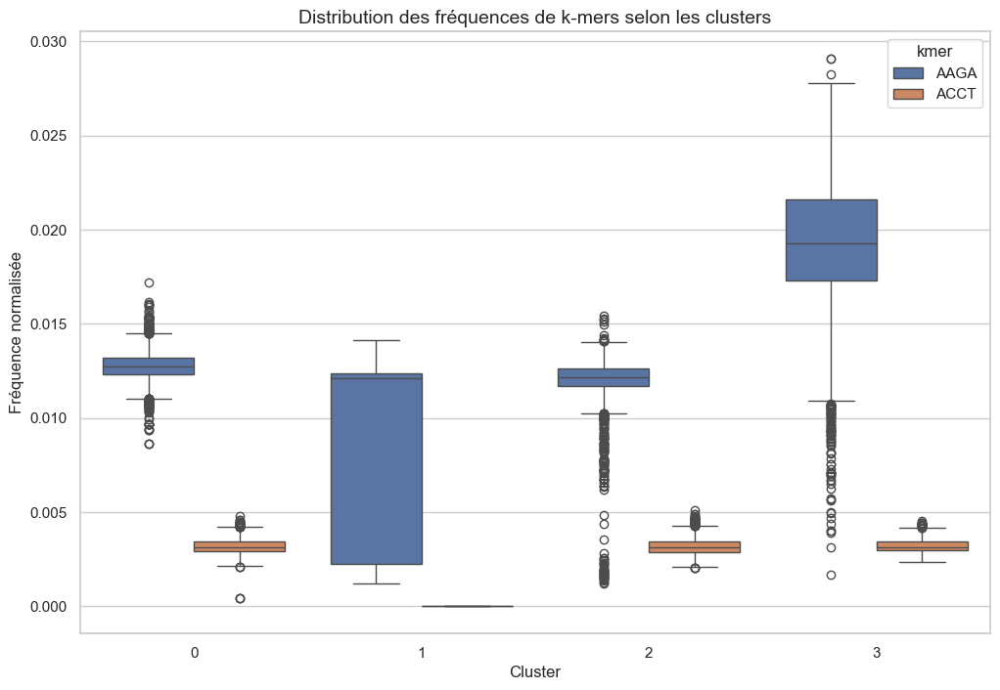

In [15]:
# Visualisation par boxplot
# -----------------------------
dfg = box_df.groupby('cluster')
counts = [len(v) for k, v in dfg]
total = float(sum(counts))
widths = [c/total for c in counts]

plt.figure(figsize=(12, 8))
sns.boxplot(x='cluster', y='rate', hue='kmer', data=box_df)
plt.title("Distribution des fréquences de k-mers selon les clusters", fontsize=14)
plt.xlabel("Cluster")
plt.ylabel("Fréquence normalisée")
plt.show()


#  Analyse ANOVA


===== Résultats ANOVA =====
  k-mer       F-value  p-value  Significatif
0  AAGA  13070.512060      0.0          True
1  ACCT   2089.499841      0.0          True


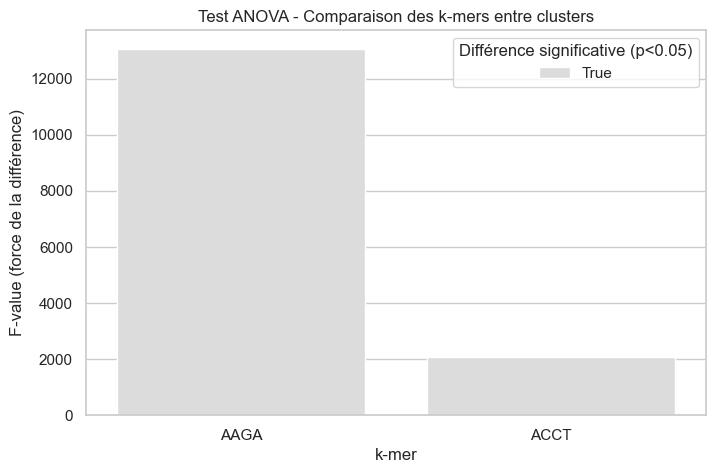

In [16]:
# -----------------------------
# 7️⃣ Analyse ANOVA (comparaison inter-clusters)
# -----------------------------

anova_results = []

# On fait une ANOVA pour chaque k-mer choisi
for kmer in kmer_sample:
    groups = [df[df['cluster'] == c][kmer].dropna() for c in df['cluster'].unique()]
    f_val, p_val = f_oneway(*groups)
    anova_results.append({'k-mer': kmer, 'F-value': f_val, 'p-value': p_val})

anova_df = pd.DataFrame(anova_results)
anova_df['Significatif'] = anova_df['p-value'] < 0.05  # seuil de 5%

print("\n===== Résultats ANOVA =====")
print(anova_df)

# -----------------------------
# 8️⃣ Visualisation des résultats
# -----------------------------
plt.figure(figsize=(8, 5))
sns.barplot(x='k-mer', y='F-value', data=anova_df, hue='Significatif', palette='coolwarm')
plt.title("Test ANOVA - Comparaison des k-mers entre clusters")
plt.xlabel("k-mer")
plt.ylabel("F-value (force de la différence)")
plt.legend(title="Différence significative (p<0.05)")
plt.show()


#  Heatmap des k-mers par cluster

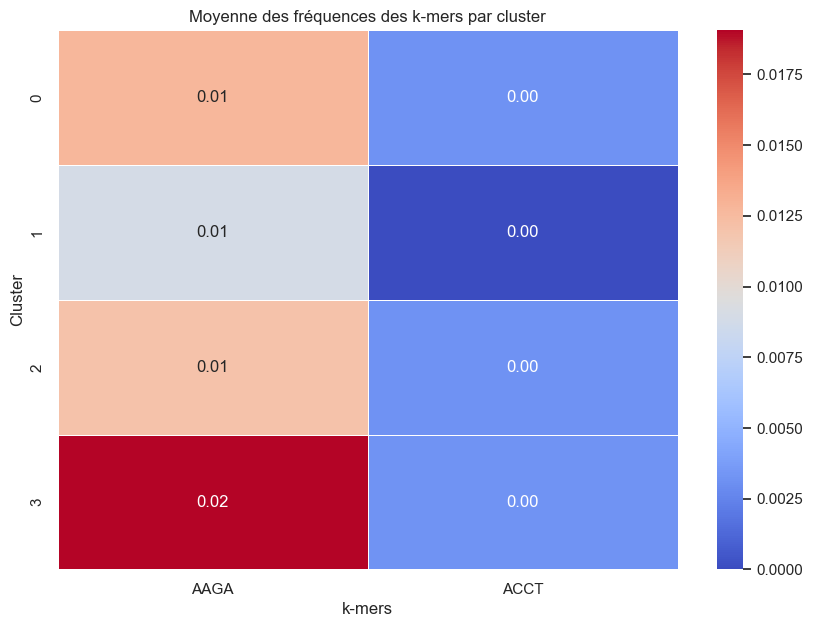

In [17]:
# -----------------------------
# Carte de chaleur des k-mers par cluster
# -----------------------------

# Calcul de la moyenne de chaque k-mer par cluster
heatmap_data = df.groupby('cluster')[kmer_sample].mean()

plt.figure(figsize=(10, 7))
sns.heatmap(
    heatmap_data,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5
)
plt.title("Moyenne des fréquences des k-mers par cluster")
plt.xlabel("k-mers")
plt.ylabel("Cluster")
plt.show()


#  Modélisation classique

In [18]:
# ==============================
# Modélisation classique
# ==============================
# Logistic Regression
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)

# Random Forest
rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

# XGBoost
xgb = XGBClassifier(eval_metric='logloss', random_state=42)
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)

# Comparaison des modèles
results = pd.DataFrame({
    'Model': ['Logistic Regression', 'Random Forest', 'XGBoost'],
    'Accuracy': [accuracy_score(y_test, y_pred_lr),
                 accuracy_score(y_test, y_pred_rf),
                 accuracy_score(y_test, y_pred_xgb)],
    'F1 Score': [f1_score(y_test, y_pred_lr),
                 f1_score(y_test, y_pred_rf),
                 f1_score(y_test, y_pred_xgb)]
})
display(results)


,Model,Accuracy,F1 Score
0,Logistic Regression,0.517512,0.523224
1,Random Forest,0.499539,0.501606
2,XGBoost,0.503917,0.504260



--- Logistic Regression ---
Accuracy : 0.5175115207373272
F1 Score : 0.523224043715847
Precision: 0.518034265103697
Recall   : 0.5285188592456301

Classification Report :
               precision    recall  f1-score   support

           0       0.52      0.51      0.51      2166
           1       0.52      0.53      0.52      2174

    accuracy                           0.52      4340
   macro avg       0.52      0.52      0.52      4340
weighted avg       0.52      0.52      0.52      4340



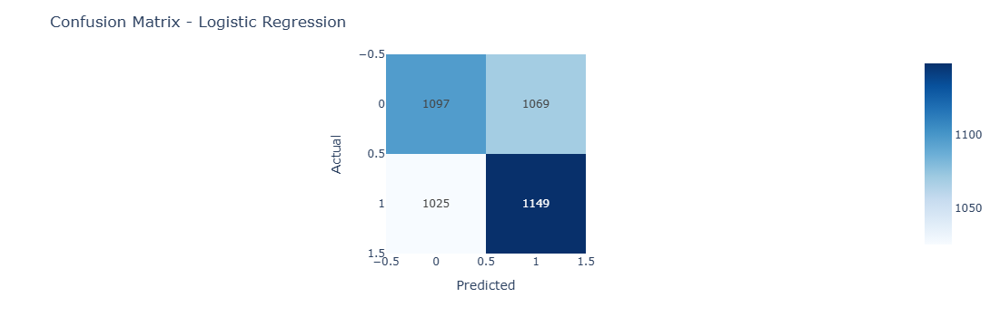


--- Random Forest ---
Accuracy : 0.49953917050691243
F1 Score : 0.5016062413951354
Precision: 0.5004578754578755
Recall   : 0.5027598896044159

Classification Report :
               precision    recall  f1-score   support

           0       0.50      0.50      0.50      2166
           1       0.50      0.50      0.50      2174

    accuracy                           0.50      4340
   macro avg       0.50      0.50      0.50      4340
weighted avg       0.50      0.50      0.50      4340



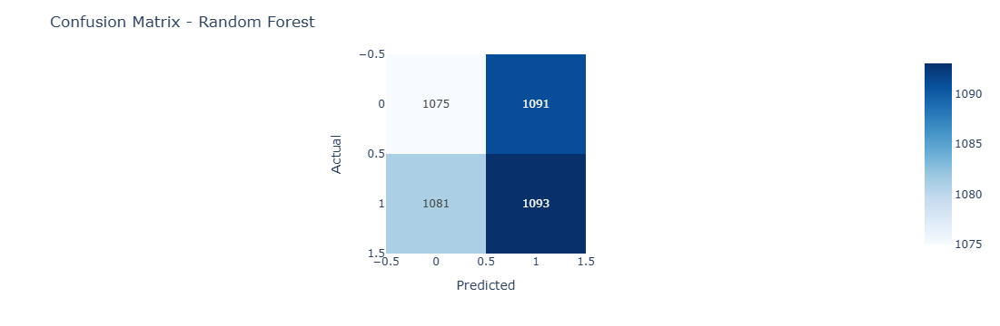


--- XGBoost ---
Accuracy : 0.5039170506912443
F1 Score : 0.5042597282984113
Precision: 0.5048409405255878
Recall   : 0.5036798528058878

Classification Report :
               precision    recall  f1-score   support

           0       0.50      0.50      0.50      2166
           1       0.50      0.50      0.50      2174

    accuracy                           0.50      4340
   macro avg       0.50      0.50      0.50      4340
weighted avg       0.50      0.50      0.50      4340



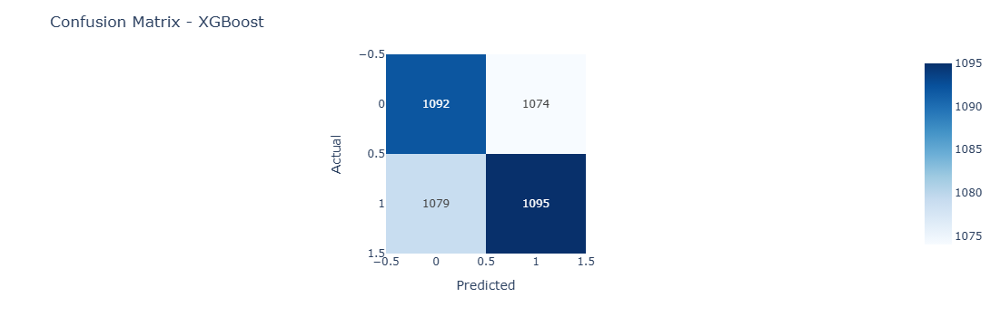

In [19]:
# ==============================
#  Évaluation et matrices de confusion
# ==============================
def evaluate_model(y_true, y_pred, model_name):
    print(f"\n--- {model_name} ---")
    print("Accuracy :", accuracy_score(y_true, y_pred))
    print("F1 Score :", f1_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred))
    print("Recall   :", recall_score(y_true, y_pred))
    print("\nClassification Report :\n", classification_report(y_true, y_pred))
    
    cm = confusion_matrix(y_true, y_pred)
    fig = px.imshow(cm, text_auto=True, color_continuous_scale='Blues')
    fig.update_layout(title=f'Confusion Matrix - {model_name}', xaxis_title="Predicted", yaxis_title="Actual")
    fig.show()

evaluate_model(y_test, y_pred_lr, "Logistic Regression")
evaluate_model(y_test, y_pred_rf, "Random Forest")
evaluate_model(y_test, y_pred_xgb, "XGBoost")


#  Courbes ROC interactives


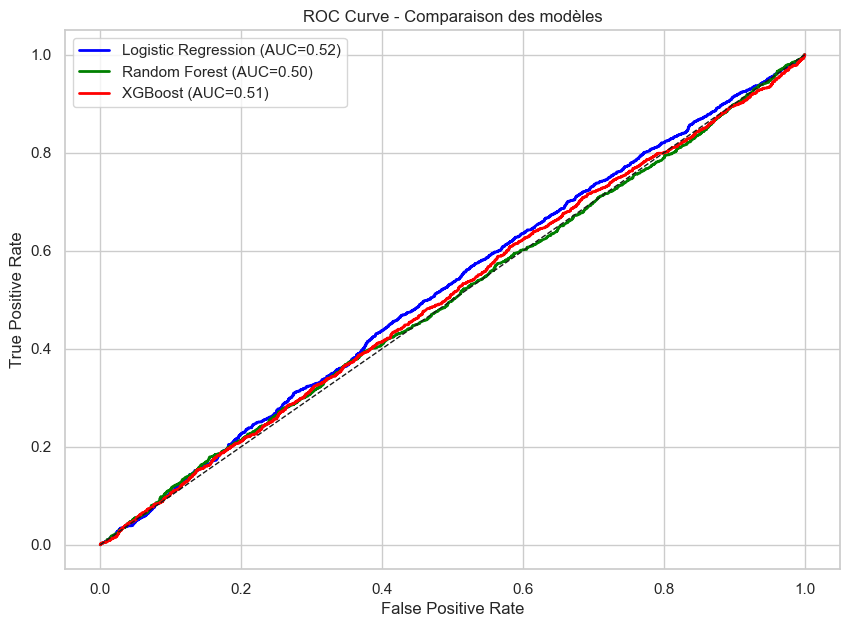

In [20]:
# ==============================
#  Courbes ROC interactives
# ==============================
plt.figure(figsize=(10,7))
for model, y_proba, color in zip(
    ['Logistic Regression', 'Random Forest', 'XGBoost'],
    [lr.predict_proba(X_test)[:,1], rf.predict_proba(X_test)[:,1], xgb.predict_proba(X_test)[:,1]],
    ['blue','green','red']
):
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    plt.plot(fpr, tpr, color=color, lw=2, label=f'{model} (AUC={auc(fpr,tpr):.2f})')

plt.plot([0,1],[0,1],'k--', lw=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC Curve - Comparaison des modèles")
plt.legend()
plt.show()


#  Importance des k-mers (Random Forest)


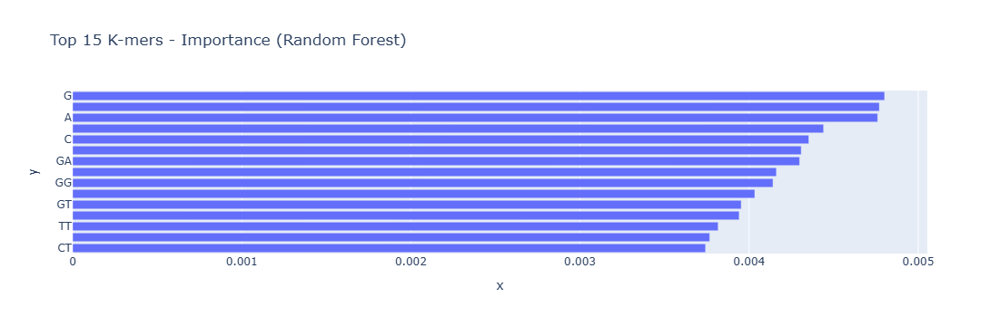

In [21]:
# ==============================
#  Importance des k-mers (Random Forest)
# ==============================
top_indices = np.argsort(rf.feature_importances_)[-15:]
top_features = X.columns[top_indices]
top_importances = rf.feature_importances_[top_indices]

fig = px.bar(x=top_importances, y=top_features, orientation='h',
             title="Top 15 K-mers - Importance (Random Forest)")
fig.show()


#  PCA 3D interactif


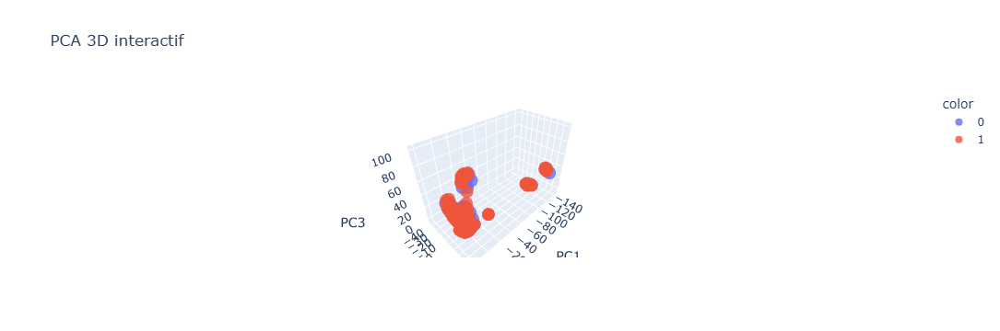

In [22]:
from sklearn.decomposition import PCA
import plotly.express as px

# PCA 3D
pca3 = PCA(n_components=3)
X_pca3 = pca3.fit_transform(X_scaled)

fig = px.scatter_3d(
    x=X_pca3[:,0], y=X_pca3[:,1], z=X_pca3[:,2],
    color=df['statut_VIH'].astype(str),
    title="PCA 3D interactif",
    labels={'x':'PC1','y':'PC2','z':'PC3'},
    opacity=0.8
)
fig.show()


#  t-SNE 3D interactif


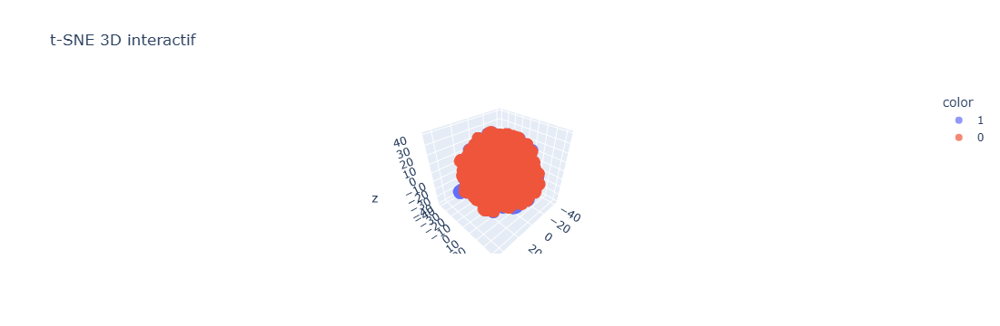

In [37]:
from sklearn.manifold import TSNE

tsne3 = TSNE(n_components=3, random_state=42, perplexity=30)
X_tsne3 = tsne3.fit_transform(X_scaled)

fig = px.scatter_3d(
    x=X_tsne3[:,0], y=X_tsne3[:,1], z=X_tsne3[:,2],
    color=df['statut_VIH'].astype(str),
    title="t-SNE 3D interactif",
    opacity=0.7
)
fig.show()

#  Histogrammes et corrélations


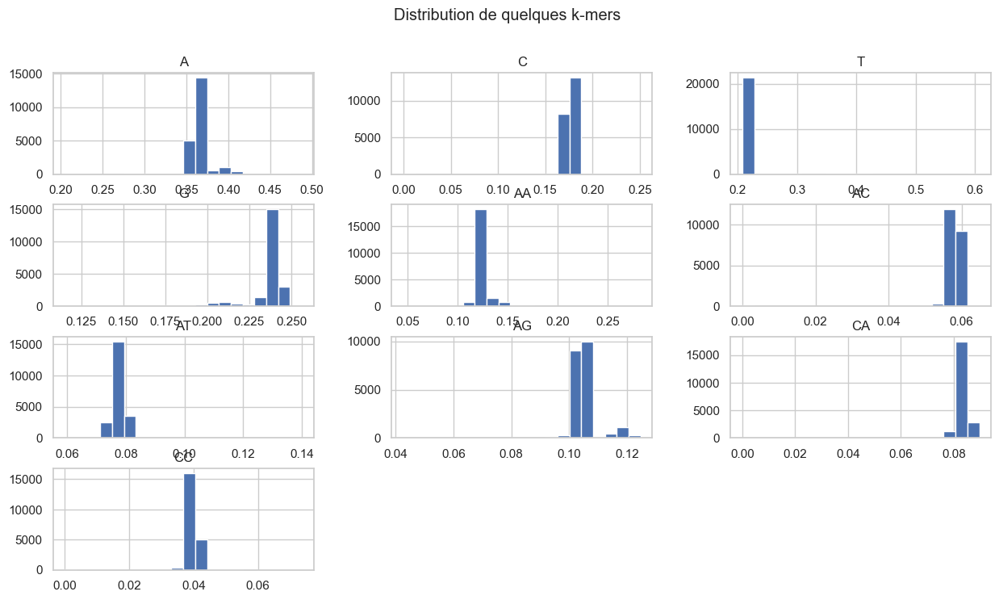

In [23]:
kmer_sample = X.columns[:10]  # choisir 10 k-mers pour visualiser
X[kmer_sample].hist(figsize=(15,8), bins=20)
plt.suptitle("Distribution de quelques k-mers")
plt.show()


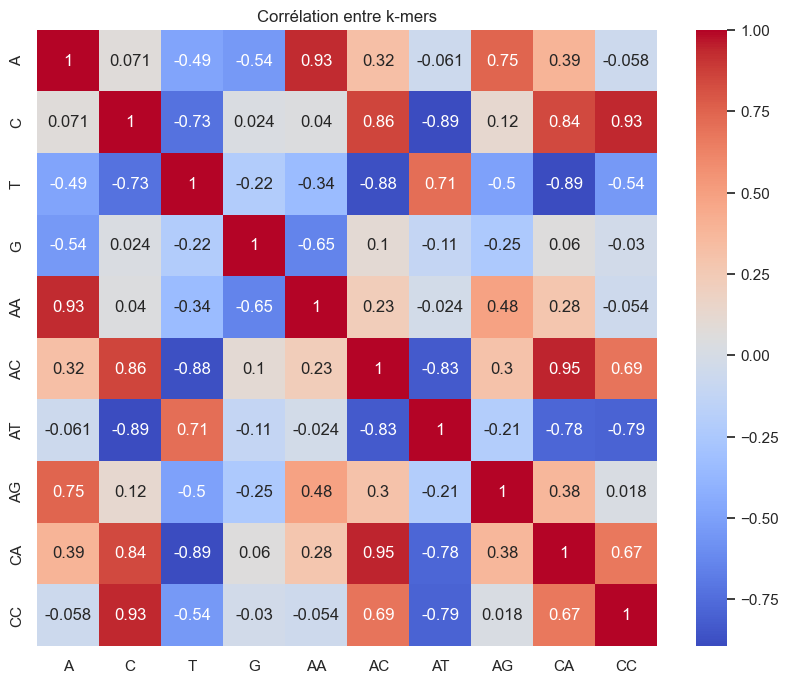

In [24]:
corr_matrix = X[kmer_sample].corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Corrélation entre k-mers")
plt.show()


### 1. Validation croisée (Cross Validation)
Cela permet de vérifier la stabilité des modèles (et éviter le surapprentissage)

In [26]:
from sklearn.model_selection import cross_val_score

for name, model in [('Logistic Regression', lr), ('Random Forest', rf), ('XGBoost', xgb)]:
    scores = cross_val_score(model, X_scaled, y, cv=5, scoring='f1')
    print(f"{name} - F1 moyenne (5-fold CV): {scores.mean():.3f} ± {scores.std():.3f}")


Logistic Regression - F1 moyenne (5-fold CV): 0.486 ± 0.031
Random Forest - F1 moyenne (5-fold CV): 0.489 ± 0.025
XGBoost - F1 moyenne (5-fold CV): 0.488 ± 0.009


### 2. Analyse de corrélation cible (Feature Target Correlation)
Voir quels k-mers sont le plus corrélés avec le statut VIH.

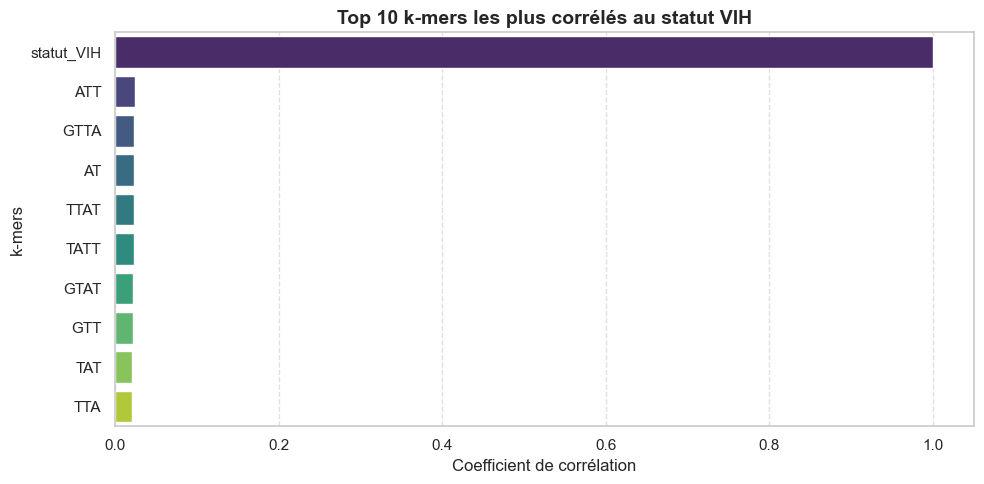

In [32]:


# Calcul des corrélations
correlations = df.corrwith(df['statut_VIH']).sort_values(ascending=False)
top_corr = correlations.head(10)

# Création du graphique
plt.figure(figsize=(10, 5))
sns.barplot(
    x=top_corr.values,
    y=top_corr.index,
    hue=top_corr.index,         # ajouté pour corriger le FutureWarning
    palette='viridis',
    legend=False                # évite une légende inutile
)

# Améliorations du style
plt.title("Top 10 k-mers les plus corrélés au statut VIH", fontsize=14, weight='bold')
plt.xlabel("Coefficient de corrélation", fontsize=12)
plt.ylabel("k-mers", fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


#  Sélection Chi²


In [28]:
from sklearn.feature_selection import SelectKBest, chi2

chi2_selector = SelectKBest(chi2, k=10)
chi2_selector.fit(X, y)
selected_features = X.columns[chi2_selector.get_support()]
print("Top 10 k-mers selon Chi² :", selected_features.tolist())


Top 10 k-mers selon Chi² : ['C', 'T', 'TT', 'TTT', 'GTT', 'TATT', 'TTAT', 'TTTT', 'GTTT', 'statut_VIH']


#  Répartition du statut VIH par cluster


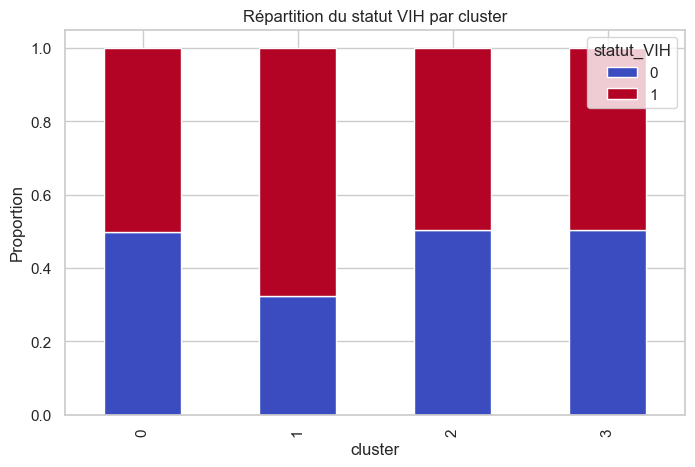

In [29]:
pd.crosstab(df['cluster'], df['statut_VIH'], normalize='index').plot.bar(
    stacked=True, colormap='coolwarm', figsize=(8,5))
plt.title("Répartition du statut VIH par cluster")
plt.ylabel("Proportion")
plt.show()


 97%|=================== | 4212/4340 [00:17<00:00]       

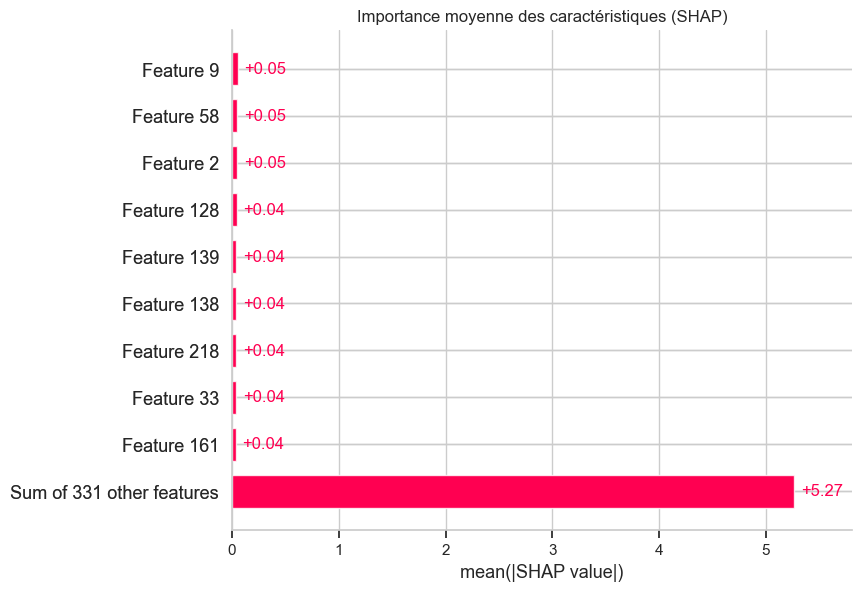

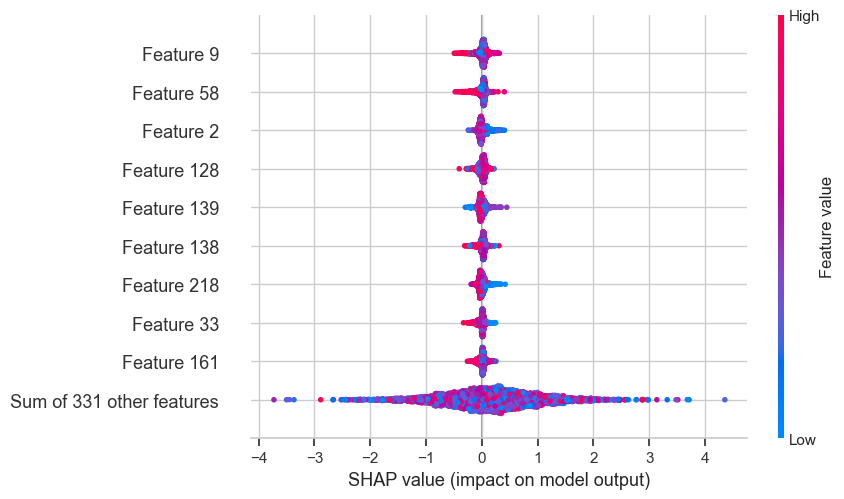

In [36]:
#  Importations nécessaires
import shap

#  Création de l'explainer moderne
# (SHAP détecte automatiquement le type de modèle, ici XGBoost)
explainer = shap.Explainer(xgb, X_train)

# Calcul des valeurs SHAP sur l'ensemble de test
shap_values = explainer(X_test)

#  --- Graphique 1 : Importance globale (barplot)
plt.title("Importance moyenne des caractéristiques (SHAP)")
shap.plots.bar(shap_values, max_display=10)
plt.show()

#  --- Graphique 2 : Beeswarm détaillé
shap.plots.beeswarm(shap_values, max_display=10)
